## Problem Statement

Develop a predictive model that assesses the claim probability for car insurance policies. The objective would be to understand the factors that influence claim frequency and severity in the period of six months and enable insurance companies to better assess risk and determine appropriate premiums for policyholders.

#### Importing libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
os.getcwd()

'C:\\Users\\manas\\Downloads\\BFSI_Project\\after_sampling'

#### Importing train & test datasets

In [3]:
Training_data_set = pd.read_csv('Insurance_train.csv')
future_pred = pd.read_csv('Insurance_test.csv')

pd.set_option('display.max_columns', None)

In [4]:
Training_data_set.head()

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,is_esc,is_adjustable_steering,is_tpms,is_parking_sensors,is_parking_camera,rear_brakes_type,displacement,cylinder,transmission_type,gear_box,steering_type,turning_radius,length,width,height,gross_weight,is_front_fog_lights,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
0,ID00001,0.515874,0.05,0.644231,C1,4990,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0
1,ID00002,0.672619,0.02,0.375000,C2,27003,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0
2,ID00003,0.841110,0.02,0.384615,C3,4076,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0
3,ID00004,0.900277,0.11,0.432692,C4,21622,1,C1,M2,Petrol,113Nm@4400rpm,88.50bhp@6000rpm,1.2 L K12N Dualjet,2,Yes,Yes,No,Yes,Yes,Drum,1197,4,Automatic,5,Electric,4.8,3995,1735,1515,1335,Yes,No,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0
4,ID00005,0.596403,0.11,0.634615,C5,34738,2,A,M3,Petrol,91Nm@4250rpm,67.06bhp@5500rpm,1.0 SCe,2,No,No,No,No,Yes,Drum,999,3,Automatic,5,Electric,5.0,3731,1579,1490,1155,No,No,No,No,No,Yes,Yes,Yes,No,Yes,Yes,Yes,2,0


#### Summarized Report

In [5]:
from pandas_profiling import ProfileReport
profile = ProfileReport(Training_data_set)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Shape of dataset

In [6]:
import pandas as pd

shape_dataset = pd.DataFrame({'Training_datatset':{'Shape': Training_data_set.shape,
                               'Total Rows': Training_data_set.shape[0],
                               'Total Columns': Training_data_set.shape[1]},
                             'Testing_datatset':{'Shape': future_pred.shape,
                              'Total Rows': future_pred.shape[0],
                              'Total Columns': future_pred.shape[1]}})


shape_dataset

,Training_datatset,Testing_datatset
Shape,"(58592, 44)","(39063, 43)"
Total Rows,58592,39063
Total Columns,44,43


#### Column names

In [7]:
Training_data_set.columns

Index(['policy_id', 'policy_tenure', 'age_of_car', 'age_of_policyholder',
       'area_cluster', 'population_density', 'make', 'segment', 'model',
       'fuel_type', 'max_torque', 'max_power', 'engine_type', 'airbags',
       'is_esc', 'is_adjustable_steering', 'is_tpms', 'is_parking_sensors',
       'is_parking_camera', 'rear_brakes_type', 'displacement', 'cylinder',
       'transmission_type', 'gear_box', 'steering_type', 'turning_radius',
       'length', 'width', 'height', 'gross_weight', 'is_front_fog_lights',
       'is_rear_window_wiper', 'is_rear_window_washer',
       'is_rear_window_defogger', 'is_brake_assist', 'is_power_door_locks',
       'is_central_locking', 'is_power_steering',
       'is_driver_seat_height_adjustable', 'is_day_night_rear_view_mirror',
       'is_ecw', 'is_speed_alert', 'ncap_rating', 'is_claim'],
      dtype='object')

#### Basic information about the data

In [8]:
Training_data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58592 entries, 0 to 58591
Data columns (total 44 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   policy_id                         58592 non-null  object 
 1   policy_tenure                     58592 non-null  float64
 2   age_of_car                        58592 non-null  float64
 3   age_of_policyholder               58592 non-null  float64
 4   area_cluster                      58592 non-null  object 
 5   population_density                58592 non-null  int64  
 6   make                              58592 non-null  int64  
 7   segment                           58592 non-null  object 
 8   model                             58592 non-null  object 
 9   fuel_type                         58592 non-null  object 
 10  max_torque                        58592 non-null  object 
 11  max_power                         58592 non-null  object 
 12  engi

##### Observations:

1. Can drop policy id column.

2. Need to perform encoding on categorical variables
   such as area_cluster, model, fuel_type, engine_type, is_esc, is_adjustable_steering, is_tpms, is_parking_sensors,          is_parking_camera, rear_brakes_type, transmission_type, steering_type, is_front_fog_lights, is_rear_window_wiper,          is_rear_window_washer, is_rear_window_defogger, is_brake_assist, is_power_door_locks, is_central_locking,                  is_power_steering, is_driver_seat_height_adjustable, is_day_night_rear_view_mirror, is_ecw, is_speed_alert 
   
3. Need to convert max_torque & max_power into int dtype

#### Converting 'max_torque' column into 'int' dtype

In [9]:
##### Training_dataset

In [10]:
Training_data_set[['torque', 'torque_rpm']] = Training_data_set['max_torque'].str.split('Nm@', expand = True)
Training_data_set['torque_rpm'] = Training_data_set['torque_rpm'].str.replace('rpm', "")

Training_data_set['torque'] = pd.to_numeric(Training_data_set['torque'])
Training_data_set['torque_rpm'] = pd.to_numeric(Training_data_set['torque_rpm'])

In [11]:
Training_data_set[['power', 'power_rpm']] = Training_data_set['max_power'].str.split('bhp@', expand = True)
Training_data_set['power_rpm'] = Training_data_set['power_rpm'].str.replace('rpm', "")

Training_data_set['power'] = pd.to_numeric(Training_data_set['power'])
Training_data_set['power_rpm'] = pd.to_numeric(Training_data_set['power_rpm'])

In [12]:
Training_data_set.head(3)

,policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,is_esc,is_adjustable_steering,is_tpms,is_parking_sensors,is_parking_camera,rear_brakes_type,displacement,cylinder,transmission_type,gear_box,steering_type,turning_radius,length,width,height,gross_weight,is_front_fog_lights,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim,torque,torque_rpm,power,power_rpm
0,ID00001,0.515874,0.05,0.644231,C1,4990,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0,60.0,3500,40.36,6000
1,ID00002,0.672619,0.02,0.375000,C2,27003,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0,60.0,3500,40.36,6000
2,ID00003,0.841110,0.02,0.384615,C3,4076,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0,60.0,3500,40.36,6000


In [13]:
# future_pred dataset

In [14]:
future_pred[['torque', 'torque_rpm']] = future_pred['max_torque'].str.split('Nm@', expand = True)
future_pred['torque_rpm'] = future_pred['torque_rpm'].str.replace('rpm', "")

future_pred['torque'] = pd.to_numeric(future_pred['torque'])
future_pred['torque_rpm'] = pd.to_numeric(future_pred['torque_rpm'])

In [15]:
future_pred[['power', 'power_rpm']] = future_pred['max_power'].str.split('bhp@', expand = True)
future_pred['power_rpm'] = future_pred['power_rpm'].str.replace('rpm', "")

future_pred['power'] = pd.to_numeric(future_pred['power'])
future_pred['power_rpm'] = pd.to_numeric(future_pred['power_rpm'])

#### Converting 'int' dtype to object dtype

In [16]:
# Train dataset

In [17]:
Training_data_set['make'] = Training_data_set['make'].astype(str)
Training_data_set['airbags'] = Training_data_set['airbags'].astype(str)
Training_data_set['cylinder'] = Training_data_set['cylinder'].astype(str)
Training_data_set['gear_box'] = Training_data_set['gear_box'].astype(str)

In [18]:
# future_pred dataset

In [19]:
future_pred['make'] = future_pred['make'].astype(str)
future_pred['airbags'] = future_pred['airbags'].astype(str)
future_pred['cylinder'] = future_pred['cylinder'].astype(str)
future_pred['gear_box'] = future_pred['gear_box'].astype(str)

#### Statistical measures

In [20]:
Training_data_set.describe().T

,count,mean,std,min,25%,50%,75%,max
policy_tenure,58592.0,0.611246,0.414156,0.002735,0.210250,0.573792,1.039104,1.396641
age_of_car,58592.0,0.069424,0.056721,0.000000,0.020000,0.060000,0.110000,1.000000
age_of_policyholder,58592.0,0.469420,0.122886,0.288462,0.365385,0.451923,0.548077,1.000000
population_density,58592.0,18826.858667,17660.174792,290.000000,6112.000000,8794.000000,27003.000000,73430.000000
displacement,58592.0,1162.355851,266.304786,796.000000,796.000000,1197.000000,1493.000000,1498.000000
turning_radius,58592.0,4.852893,0.228061,4.500000,4.600000,4.800000,5.000000,5.200000
length,58592.0,3850.476891,311.457119,3445.000000,3445.000000,3845.000000,3995.000000,4300.000000
width,58592.0,1672.233667,112.089135,1475.000000,1515.000000,1735.000000,1755.000000,1811.000000
height,58592.0,1553.335370,79.622270,1475.000000,1475.000000,1530.000000,1635.000000,1825.000000
gross_weight,58592.0,1385.276813,212.423085,1051.000000,1185.000000,1335.000000,1510.000000,1720.000000


In [21]:
print('Total number of int/float objects :', len(Training_data_set.describe().T))

Total number of int/float objects : 16


In [22]:
Training_data_set.describe(include="O").T.drop(['max_torque', 'max_power'])

,count,unique,top,freq
policy_id,58592,58592,ID00001,1
area_cluster,58592,22,C8,13654
make,58592,5,1,38126
segment,58592,6,B2,18314
model,58592,11,M1,14948
fuel_type,58592,3,Petrol,20532
engine_type,58592,11,F8D Petrol Engine,14948
airbags,58592,3,2,40425
is_esc,58592,2,No,40191
is_adjustable_steering,58592,2,Yes,35526


In [23]:
print('Total number of categorical objects :',len(Training_data_set.describe(include="O").T.drop(['max_torque', 'max_power'])))

Total number of categorical objects : 30


#### Handling duplicates

In [24]:
print(Training_data_set.duplicated().sum())
print(future_pred.duplicated().sum())

# No duplicate rows found

0
0


#### Handling null values

In [25]:
print(Training_data_set.isnull().sum().sum())
print(future_pred.isnull().sum().sum())

# No missing values found

0
0


#### Number of unique values in target variable

Text(0.5, 1.0, 'Total number of claims')

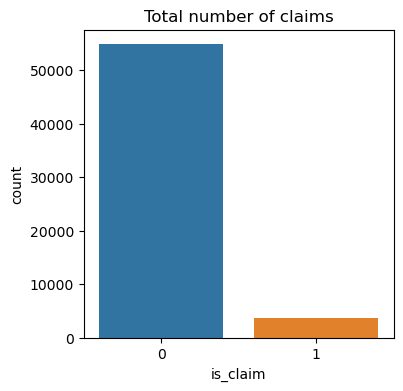

In [26]:
plt.figure(figsize=(4,4))
sns.countplot(x='is_claim',data=Training_data_set)
plt.title("Total number of claims")

In [27]:
print(f'Out of {len(Training_data_set)} no. of claims, total {Training_data_set["is_claim"].value_counts()[1]} number of claims were reported.')

Out of 58592 no. of claims, total 3748 number of claims were reported.


In [28]:
# percentage of people claimed 

Training_data_set['is_claim'].value_counts()/len(Training_data_set['is_claim'])*100

0    93.603222
1     6.396778
Name: is_claim, dtype: float64

##### Observation:
1. Dataset is hightly imbalance

#### Visulaization

#### Univariate Analysis

area_cluster


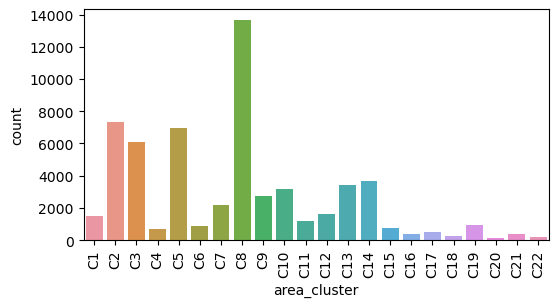

C8    13654
C2     7342
C5     6979
Name: area_cluster, dtype: int64


make


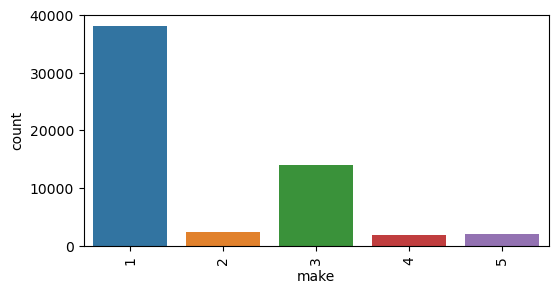

1    38126
3    14018
2     2373
Name: make, dtype: int64


segment


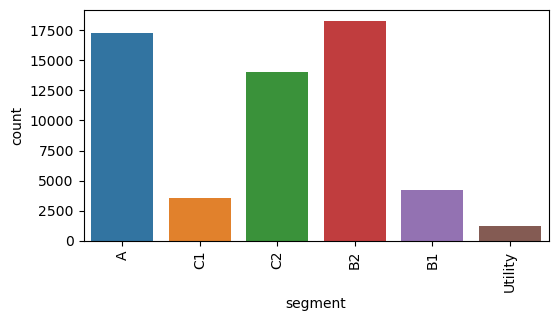

B2    18314
A     17321
C2    14018
Name: segment, dtype: int64


model


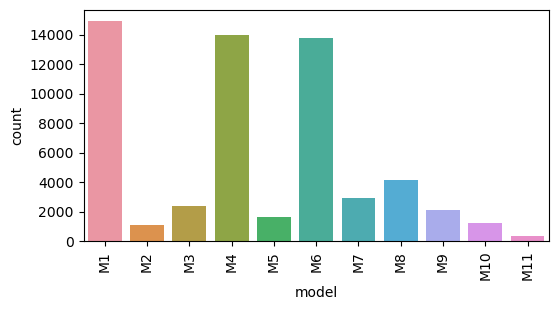

M1    14948
M4    14018
M6    13776
Name: model, dtype: int64


fuel_type


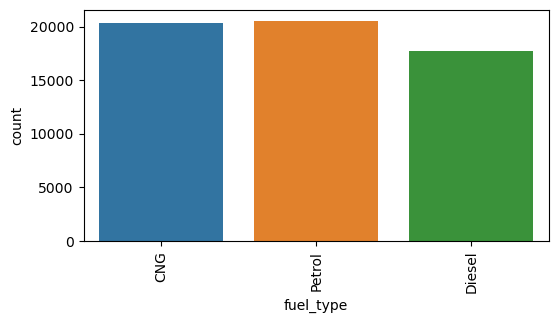

Petrol    20532
CNG       20330
Diesel    17730
Name: fuel_type, dtype: int64


engine_type


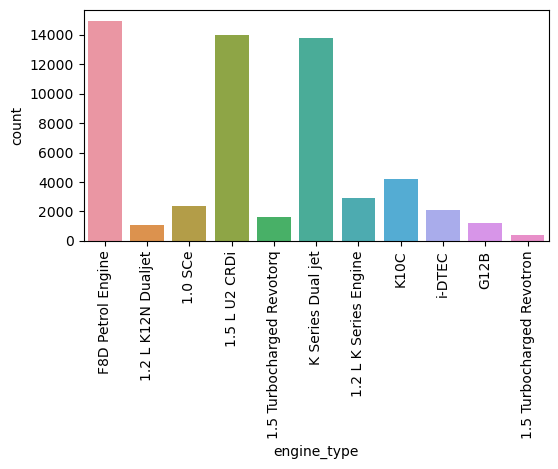

F8D Petrol Engine    14948
1.5 L U2 CRDi        14018
K Series Dual jet    13776
Name: engine_type, dtype: int64


airbags


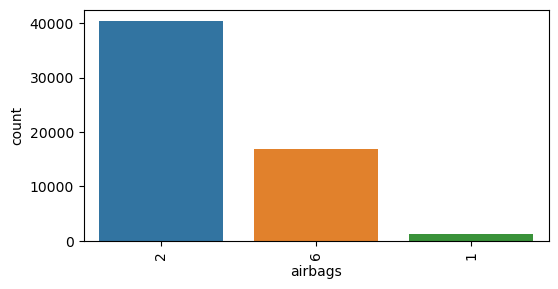

2    40425
6    16958
1     1209
Name: airbags, dtype: int64


is_esc


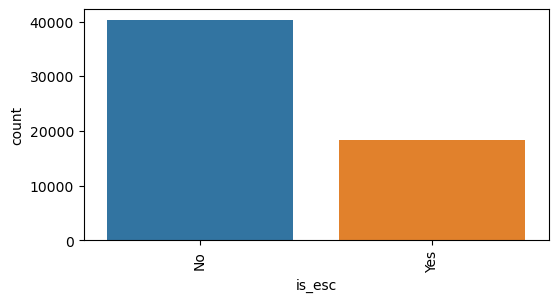

No     40191
Yes    18401
Name: is_esc, dtype: int64


is_adjustable_steering


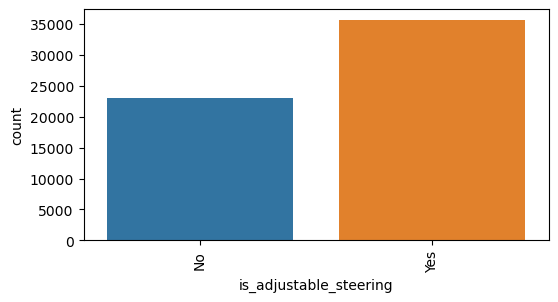

Yes    35526
No     23066
Name: is_adjustable_steering, dtype: int64


is_tpms


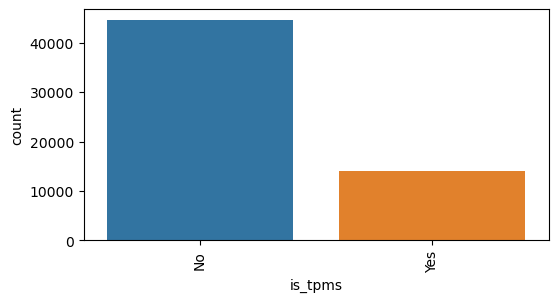

No     44574
Yes    14018
Name: is_tpms, dtype: int64


is_parking_sensors


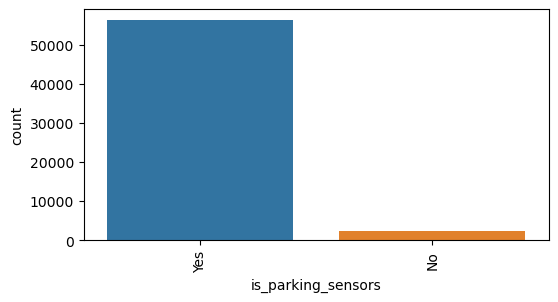

Yes    56219
No      2373
Name: is_parking_sensors, dtype: int64


is_parking_camera


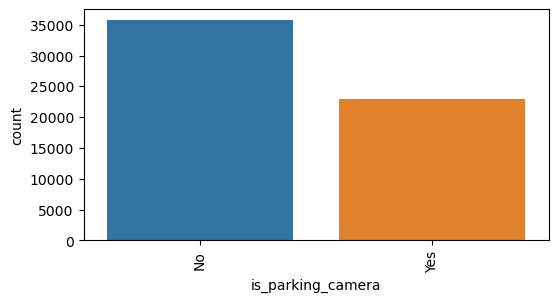

No     35704
Yes    22888
Name: is_parking_camera, dtype: int64


rear_brakes_type


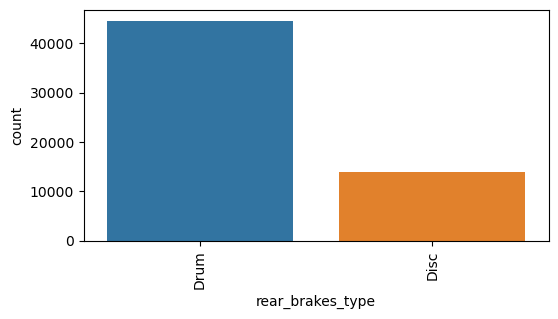

Drum    44574
Disc    14018
Name: rear_brakes_type, dtype: int64


cylinder


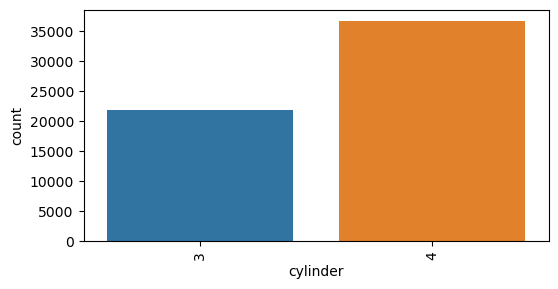

4    36735
3    21857
Name: cylinder, dtype: int64


transmission_type


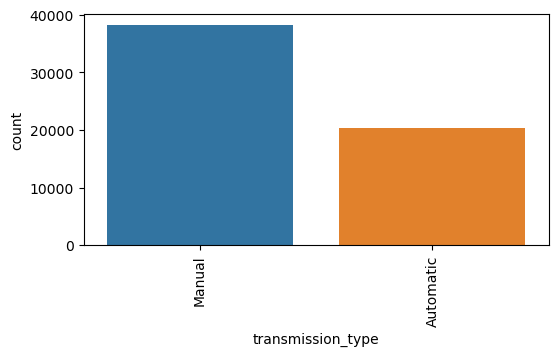

Manual       38181
Automatic    20411
Name: transmission_type, dtype: int64


gear_box


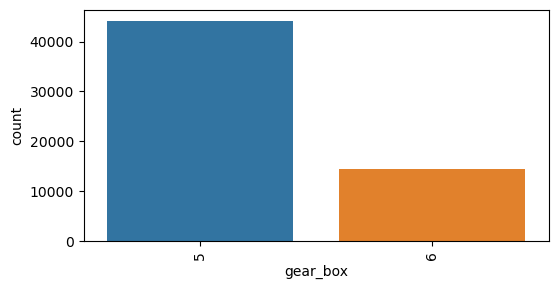

5    44211
6    14381
Name: gear_box, dtype: int64


steering_type


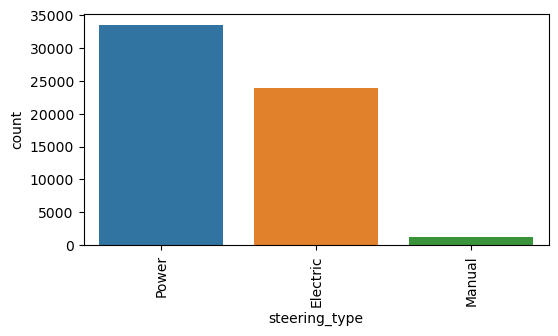

Power       33502
Electric    23881
Manual       1209
Name: steering_type, dtype: int64


is_front_fog_lights


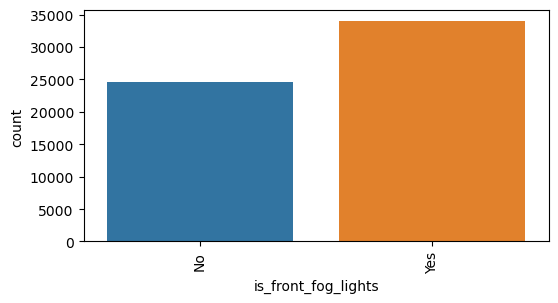

Yes    33928
No     24664
Name: is_front_fog_lights, dtype: int64


is_rear_window_wiper


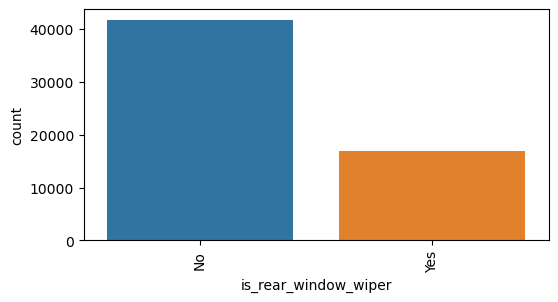

No     41634
Yes    16958
Name: is_rear_window_wiper, dtype: int64


is_rear_window_washer


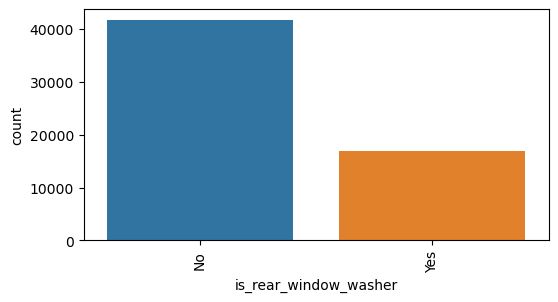

No     41634
Yes    16958
Name: is_rear_window_washer, dtype: int64


is_rear_window_defogger


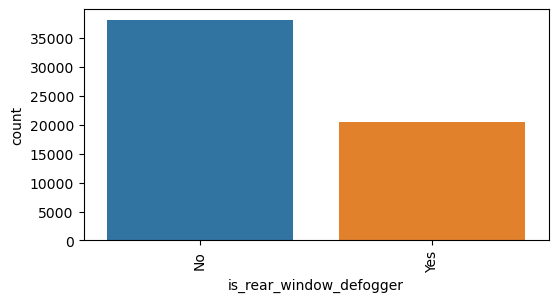

No     38077
Yes    20515
Name: is_rear_window_defogger, dtype: int64


is_brake_assist


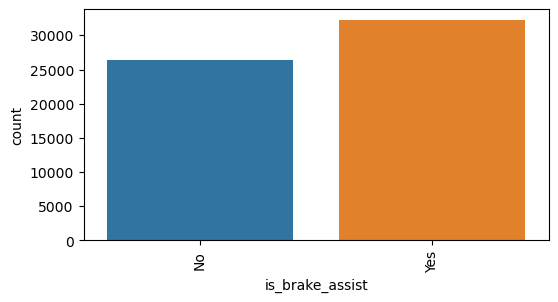

Yes    32177
No     26415
Name: is_brake_assist, dtype: int64


is_power_door_locks


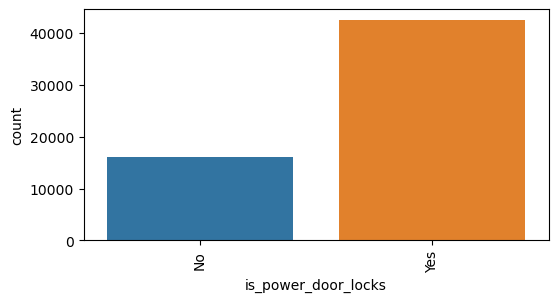

Yes    42435
No     16157
Name: is_power_door_locks, dtype: int64


is_central_locking


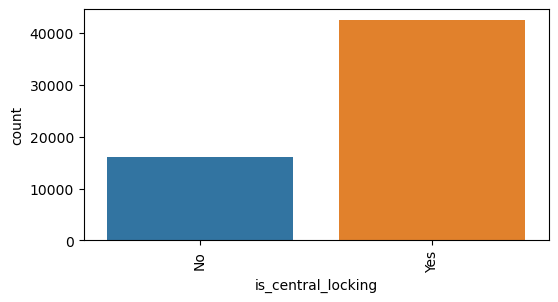

Yes    42435
No     16157
Name: is_central_locking, dtype: int64


is_power_steering


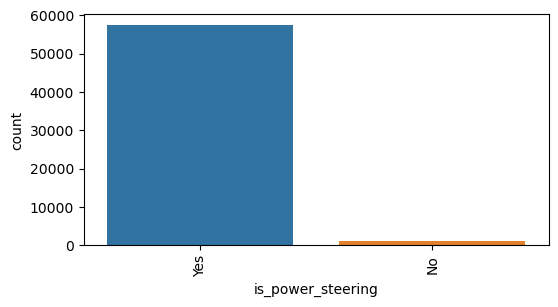

Yes    57383
No      1209
Name: is_power_steering, dtype: int64


is_driver_seat_height_adjustable


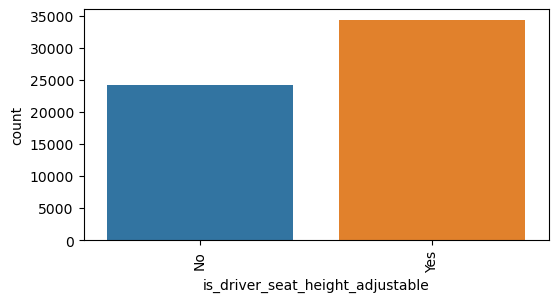

Yes    34291
No     24301
Name: is_driver_seat_height_adjustable, dtype: int64


is_day_night_rear_view_mirror


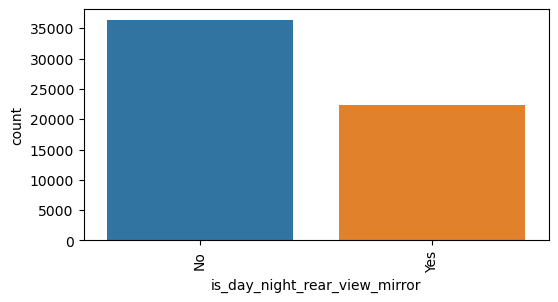

No     36309
Yes    22283
Name: is_day_night_rear_view_mirror, dtype: int64


is_ecw


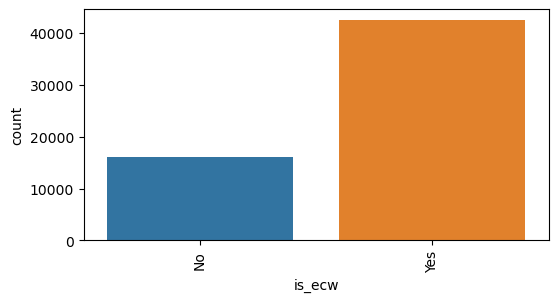

Yes    42435
No     16157
Name: is_ecw, dtype: int64


is_speed_alert


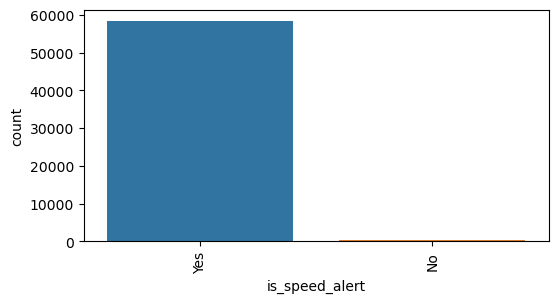

Yes    58229
No       363
Name: is_speed_alert, dtype: int64




In [29]:
for columns in Training_data_set.describe(include = 'object').drop(['policy_id', 'max_torque', 'max_power'],axis = 1):
    plt.figure(figsize = (6,3))
    sns.countplot(x = columns, data=Training_data_set)
    plt.xticks(rotation=90)
    print(columns)
    plt.show()
    print(Training_data_set[columns].value_counts().head(3), end = '\n\n\n')

#### Bivariate Analysis

In [30]:
# Area Cluster

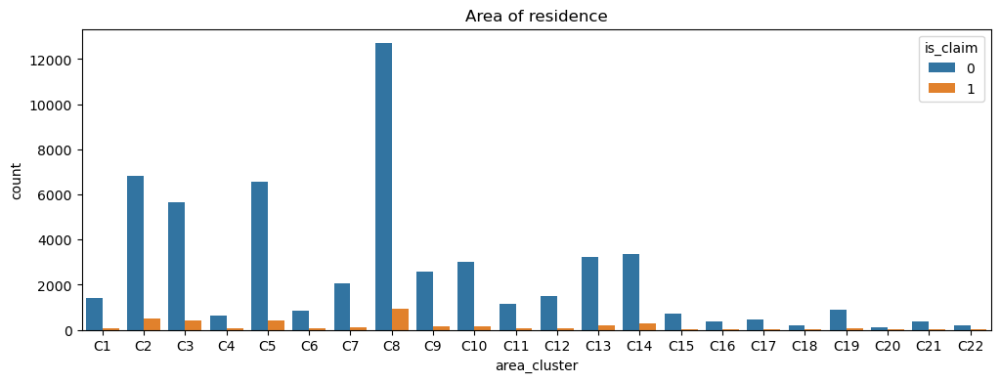

In [31]:
plt.figure(figsize = (12,4))
sns.countplot(x="area_cluster", data=Training_data_set, hue = 'is_claim')
plt.title("Area of residence")
plt.show()

##### Observations:

In [32]:
print(f'Out of the customers buying insurance policies, the majority, comprising {Training_data_set["area_cluster"].value_counts()[0]} individuals, belong to the C8 area and then followed by C2 & C5 area.', end = '\n\n')

print(f"Total number of claims recorded from 'C8' category : {Training_data_set[(Training_data_set['area_cluster'] == 'C8') & (Training_data_set['is_claim'] == 1)].count()[0]} nos.")

Out of the customers buying insurance policies, the majority, comprising 13654 individuals, belong to the C8 area and then followed by C2 & C5 area.

Total number of claims recorded from 'C8' category : 954 nos.


In [33]:
# Policy tenure vs is_claim

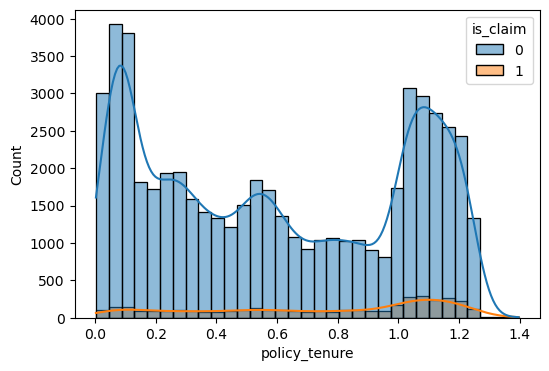

In [34]:
plt.figure(figsize = (6,4))
sns.histplot(x="policy_tenure",data=Training_data_set,kde=True, hue = 'is_claim')
plt.show()

##### Observations
- Majority of individulas who claimed the policy have a policy tenure between 1.0 to 1.2

In [35]:
print(f"Total number of claims recorded for a tenure less than 6 months : {Training_data_set[(Training_data_set['policy_tenure']<= 0.6) & (Training_data_set['is_claim'] == 1.0)].count()[1]} nos.")
print(f"Total number of claims recorded between tenure greater than 6 months & less than 1 year : {Training_data_set[(Training_data_set['policy_tenure']> 0.6) & (Training_data_set['policy_tenure']<= 1.0) & (Training_data_set['is_claim'] == 1.0)].count()[0]} nos.")
print(f"Total number of claims recorded for a tenure greater than 1 year : {Training_data_set[(Training_data_set['policy_tenure']> 1.0) & (Training_data_set['is_claim'] == 1.0)].count()[0]} nos.")

Total number of claims recorded for a tenure less than 6 months : 1413 nos.
Total number of claims recorded between tenure greater than 6 months & less than 1 year : 829 nos.
Total number of claims recorded for a tenure greater than 1 year : 1506 nos.


In [36]:
# Age of the car vs is_claim

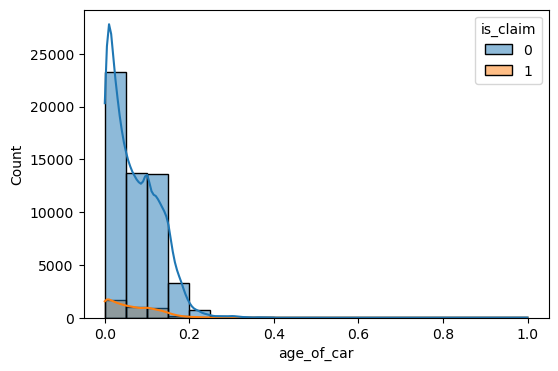

In [37]:
plt.figure(figsize = (6,4))
sns.histplot(x="age_of_car",data=Training_data_set,kde=True, hue = 'is_claim', bins = 20)
plt.show()

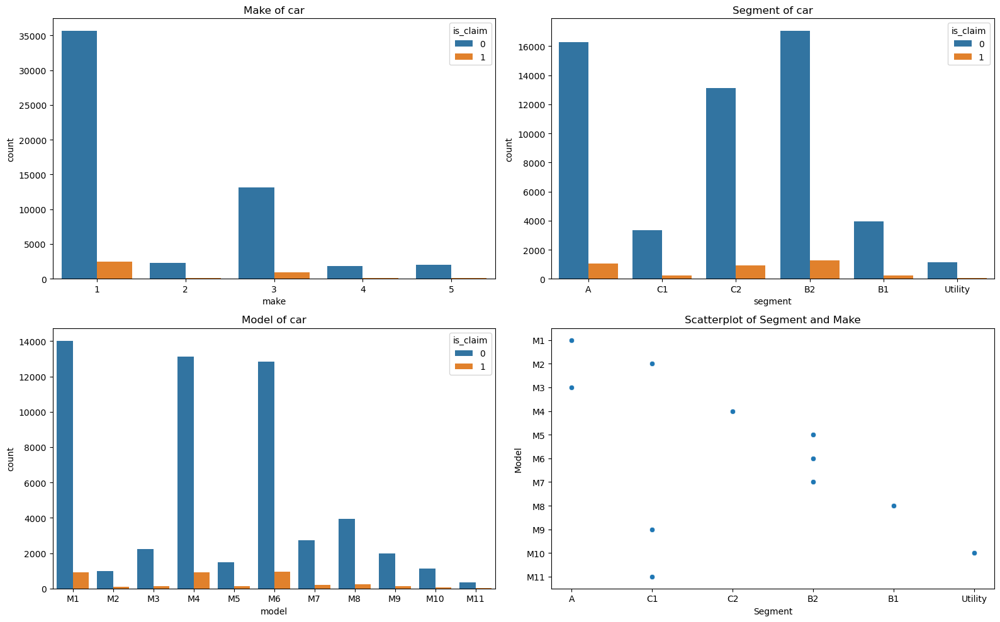

In [38]:
plt.subplots(2,2,figsize=(16,10))

plt.subplot(2,2,1)
sns.countplot(x="make", data=Training_data_set, hue = 'is_claim')
plt.title("Make of car")

plt.subplot(2,2,2)
sns.countplot(x="segment", data=Training_data_set, hue = 'is_claim')
plt.title("Segment of car")

plt.subplot(2,2,3)
sns.countplot(x="model", data=Training_data_set, hue = 'is_claim')
plt.title("Model of car")

plt.subplot(2,2,4)
sns.scatterplot(x="segment", y="model", data=Training_data_set, palette=["blue", "red"])
plt.xlabel("Segment")
plt.ylabel("Model")
plt.title("Scatterplot of Segment and Make")

plt.tight_layout()

##### Observations

In [39]:
print('1. The make or manufacturer falling under category 1 & 3 have recorded more claims as compare to other make.')
print(f"Total number of claims recorded from make belongs to category 1 : {Training_data_set[(Training_data_set['make'] == 1) & (Training_data_set['is_claim'] == 1)].count()[1]} nos.")
print(f"Total number of claims recorded from make belongs to category 3 : {Training_data_set[(Training_data_set['make'] == 3) & (Training_data_set['is_claim'] == 1)].count()[1]} nos.", end = '\n\n')

print('2. Maximum numbers of claimed recorder belong to B2, A & C2 segment.')
print(f"Total number of claims recorded from 'B2' segment : {Training_data_set[(Training_data_set['segment'] == 'B2') & (Training_data_set['is_claim'] == 1)].count()[1]} nos.")
print(f"Total number of claims recorded from 'A' segment : {Training_data_set[(Training_data_set['segment'] == 'A') & (Training_data_set['is_claim'] == 1)].count()[1]} nos.")
print(f"Total number of claims recorded from 'C2' segment : {Training_data_set[(Training_data_set['segment'] == 'C2') & (Training_data_set['is_claim'] == 1)].count()[1]} nos.", end = '\n\n')

print('3. The model numbers of cars that have recorded the maximum number of claims belong to the M6, M1, and M4 categories, with the highest number of claims in the M6 category, followed by the M1 category, and then the M4 category.')
print(f"Total number of claims recorded from model belongs to 'M6' category : {Training_data_set[(Training_data_set['model'] == 'M6') & (Training_data_set['is_claim'] == 1)].count()[1]} nos.")
print(f"Total number of claims recorded from model belongs to 'M1' category : {Training_data_set[(Training_data_set['model'] == 'M1') & (Training_data_set['is_claim'] == 1)].count()[1]} nos.")
print(f"Total number of claims recorded from model belongs to 'M4' category : {Training_data_set[(Training_data_set['model'] == 'M4') & (Training_data_set['is_claim'] == 1)].count()[1]} nos.", end = '\n\n')

print("4. The scatterplot shows that cars belonging to the models 'M6' falls in the 'B2' segment, 'M1' falls in the 'A' segment, and 'M4' falls in the 'C2' segment")

1. The make or manufacturer falling under category 1 & 3 have recorded more claims as compare to other make.
Total number of claims recorded from make belongs to category 1 : 0 nos.
Total number of claims recorded from make belongs to category 3 : 0 nos.

2. Maximum numbers of claimed recorder belong to B2, A & C2 segment.
Total number of claims recorded from 'B2' segment : 1256 nos.
Total number of claims recorded from 'A' segment : 1046 nos.
Total number of claims recorded from 'C2' segment : 901 nos.

3. The model numbers of cars that have recorded the maximum number of claims belong to the M6, M1, and M4 categories, with the highest number of claims in the M6 category, followed by the M1 category, and then the M4 category.
Total number of claims recorded from model belongs to 'M6' category : 939 nos.
Total number of claims recorded from model belongs to 'M1' category : 918 nos.
Total number of claims recorded from model belongs to 'M4' category : 901 nos.

4. The scatterplot shows 

In [40]:
# NCAP rating

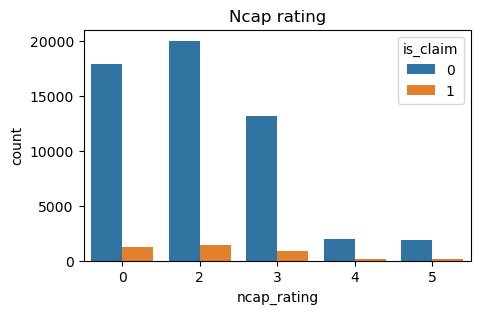

In [41]:
plt.figure(figsize = (5,3))
sns.countplot(x="ncap_rating", data=Training_data_set, hue = 'is_claim')
plt.title("Ncap rating")
plt.show()

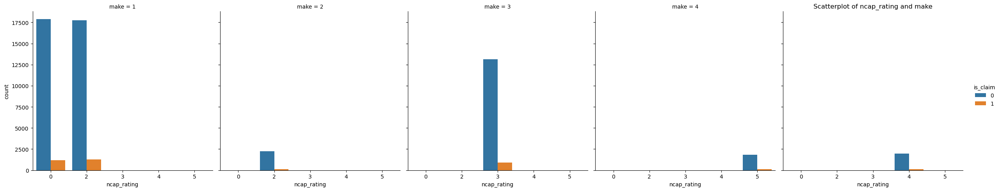

In [42]:
sns.catplot(x="ncap_rating",hue="is_claim",data=Training_data_set,kind="count", col = 'make')
plt.title("Scatterplot of ncap_rating and make")
plt.show()

##### Observations

1. Maximum numbers of claims recorded of car having low Ncap rating (i.e bellow 3)
2. The catplot shows make of a car having Ncap rating bellow 3 

#### Deleting unrequired columns from dataset

In [43]:
Training_data_set_ = Training_data_set.drop(['policy_id','max_torque','max_power'], axis = 1)
future_pred_ = future_pred.drop(['policy_id','max_torque','max_power'], axis = 1)

#### Checking Outliers / Skewness / Kurtosis

In [44]:
import scipy.stats as stats
from scipy.stats import kurtosis

In [45]:
def box_plot(data):
    plt.figure(figsize=(3,2))
    sns.boxplot(data=data)
    plt.show()

policy_tenure
skewness : 0.05358638372275689
The distribution in policy_tenure is fairly symmetrical
kurtosis : -1.4983240468734704
The distribution in policy_tenure is highly platykurtic (light-tailed).


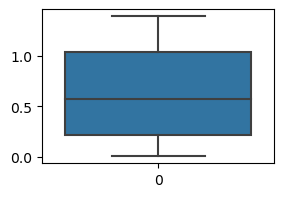

age_of_car
skewness : 1.0940532167390844
The distribution in age_of_car is highly skewed to the right
kurtosis : 5.300790320682983
The distribution in age_of_car is highly leptokurtic (heavy-tailed).


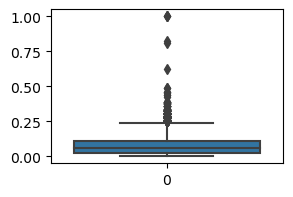

age_of_policyholder
skewness : 0.6400329288750934
The distribution in age_of_policyholder is fairly symmetrical
kurtosis : -0.15687106718969712
The distribution in age_of_policyholder is fairly mesokurtic (similar to a normal distribution).


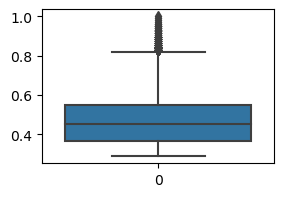

population_density
skewness : 1.674134937861629
The distribution in population_density is highly skewed to the right
kurtosis : 2.5884734636472784
The distribution in population_density is highly leptokurtic (heavy-tailed).


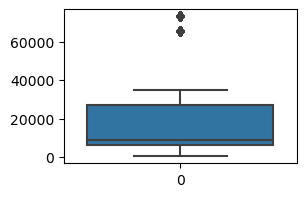

displacement
skewness : -0.10531399778108161
The distribution in displacement is fairly symmetrical
kurtosis : -1.3423887608839364
The distribution in displacement is highly platykurtic (light-tailed).


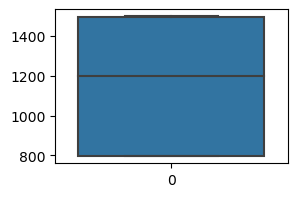

turning_radius
skewness : 0.4209720384852283
The distribution in turning_radius is fairly symmetrical
kurtosis : -1.1766483912474557
The distribution in turning_radius is highly platykurtic (light-tailed).


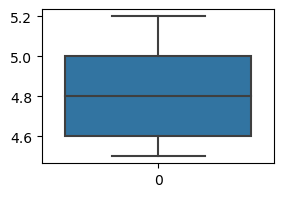

length
skewness : 0.14579719745761982
The distribution in length is fairly symmetrical
kurtosis : -1.20900570482629
The distribution in length is highly platykurtic (light-tailed).


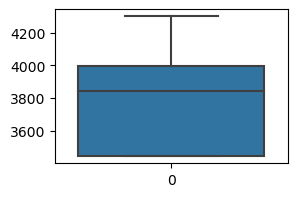

width
skewness : -0.48837912317355436
The distribution in width is fairly symmetrical
kurtosis : -1.4434882325714697
The distribution in width is highly platykurtic (light-tailed).


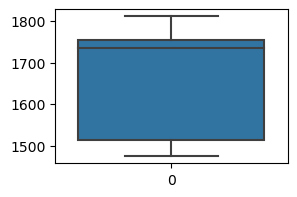

height
skewness : 1.0354712302815692
The distribution in height is highly skewed to the right
kurtosis : 0.7259979274144728
The distribution in height is fairly mesokurtic (similar to a normal distribution).


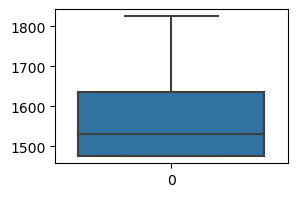

gross_weight
skewness : 0.5469347664324941
The distribution in gross_weight is fairly symmetrical
kurtosis : -1.0238445831435878
The distribution in gross_weight is highly platykurtic (light-tailed).


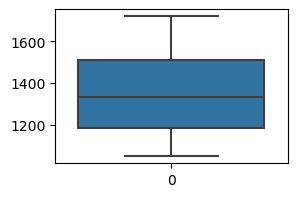

torque
skewness : 0.6717820148446785
The distribution in torque is fairly symmetrical
kurtosis : -1.1648283582117256
The distribution in torque is highly platykurtic (light-tailed).


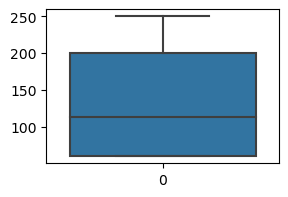

torque_rpm
skewness : -0.2968477075068725
The distribution in torque_rpm is fairly symmetrical
kurtosis : -0.6915093677583868
The distribution in torque_rpm is fairly mesokurtic (similar to a normal distribution).


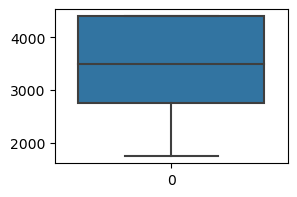

power
skewness : -0.2365930351018895
The distribution in power is fairly symmetrical
kurtosis : -1.385632523028523
The distribution in power is highly platykurtic (light-tailed).


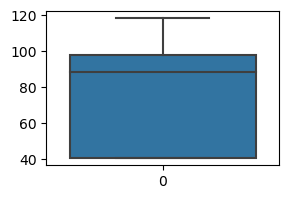

power_rpm
skewness : -0.755009707338284
The distribution in power_rpm is fairly symmetrical
kurtosis : -1.2754318210029965
The distribution in power_rpm is highly platykurtic (light-tailed).


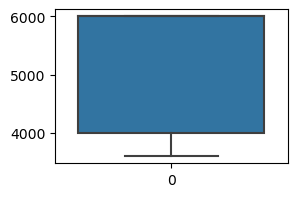

In [46]:
for i in Training_data_set_.describe().drop(['is_claim', 'ncap_rating'], axis = 1):
    print(i)
    skewness = stats.skew(Training_data_set_[i])
    print('skewness :', skewness)
        
    if skewness < -1:
        print('The distribution in', i, 'is highly skewed to the left')
    elif skewness > 1:
        print('The distribution in', i, 'is highly skewed to the right')
    elif -1 <= skewness <= 1:
        print('The distribution in', i, 'is fairly symmetrical')
        
    kurtosis_val = kurtosis(Training_data_set_[i], fisher = True)
    print('kurtosis :',kurtosis_val)
    if kurtosis_val < -1:
        print('The distribution in', i, 'is highly platykurtic (light-tailed).')
    elif kurtosis_val > 1:
        print('The distribution in', i, 'is highly leptokurtic (heavy-tailed).')
    else:
        print('The distribution in', i, 'is fairly mesokurtic (similar to a normal distribution).')
        
    box_plot(Training_data_set_[i])

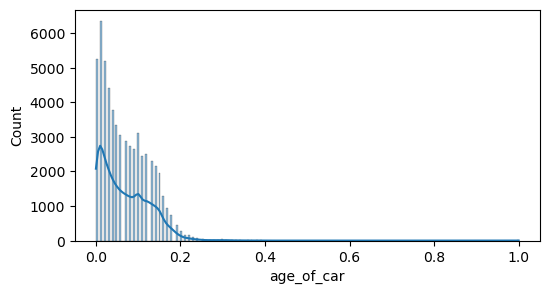

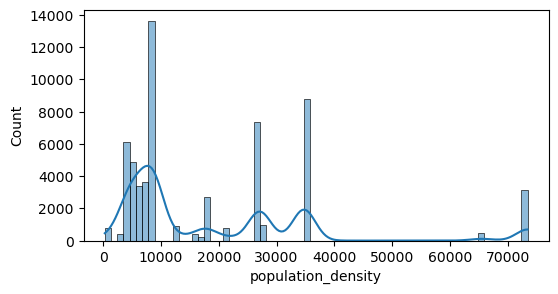

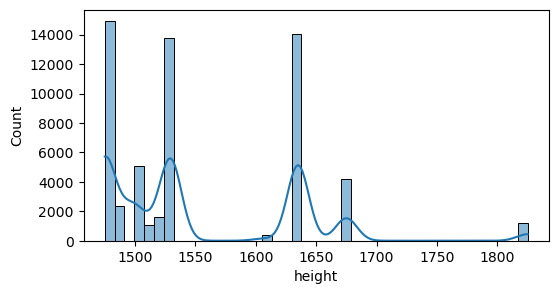

In [47]:
for columns in Training_data_set_[['age_of_car', 'population_density', 'height']]:
    plt.figure(figsize = (6,3))
    sns.histplot(x= columns ,data=Training_data_set_,kde=True)
    plt.show()

#### Handling skewness

In [48]:
print('Skewness before applying transformation techniques:', end = '\n\n')

Skewness_ = {'Train dataset':{'age_of_car' : stats.skew(Training_data_set_['age_of_car']), 
                                          'population_density' : stats.skew(Training_data_set_['population_density'])},
            'Test dataset':{'age_of_car' : stats.skew(future_pred_['age_of_car']), 
                                          'population_density' : stats.skew(future_pred_['population_density'])}}
pd.DataFrame(Skewness_)

Skewness before applying transformation techniques:



,Train dataset,Test dataset
age_of_car,1.094053,1.185678
population_density,1.674135,1.675418


In [49]:
# yeo-johnson

In [50]:
from sklearn.preprocessing import PowerTransformer

power_trans = PowerTransformer(method='yeo-johnson')

Training_data_set_[["age_of_car", "population_density"]] = power_trans.fit_transform(Training_data_set_[["age_of_car", "population_density"]])
future_pred_[["age_of_car", "population_density"]] = power_trans.transform(future_pred_[["age_of_car", "population_density"]])

In [51]:
print('Skewness after applying transformation technique:', end = '\n\n')

Skewness_trans= {'Train data':{'age_of_car' : stats.skew(Training_data_set_['age_of_car']), 
                                          'population_density' : stats.skew(Training_data_set_['population_density'])},
                'Test data':{'age_of_car' : stats.skew(future_pred_['age_of_car']), 
                                          'population_density' : stats.skew(future_pred_['population_density'])}}
pd.DataFrame(Skewness_trans)

Skewness after applying transformation technique:



,Train data,Test data
age_of_car,0.124485,0.122345
population_density,0.013148,0.011520


#### Correlation

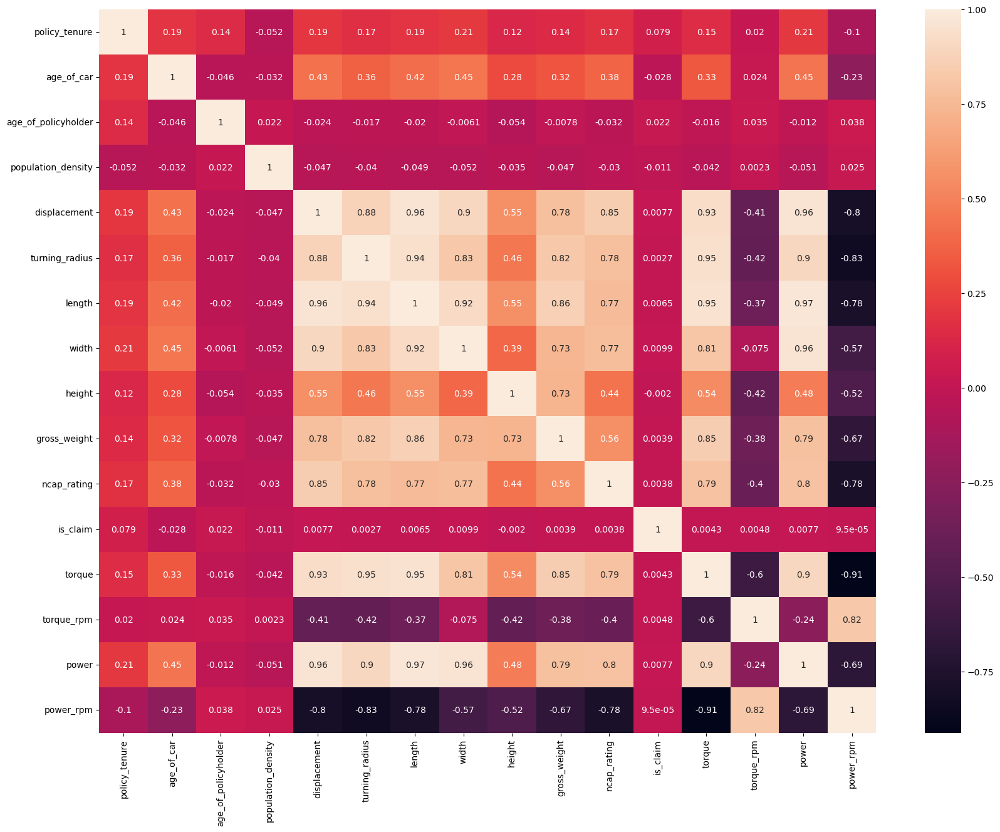

In [52]:
plt.figure(figsize=(20,15))
sns.heatmap(Training_data_set_.corr(), annot = True)
plt.show()

#### Encoding

In [53]:
Training_data_set_.select_dtypes(include = 'object').nunique()

area_cluster                        22
make                                 5
segment                              6
model                               11
fuel_type                            3
engine_type                         11
airbags                              3
is_esc                               2
is_adjustable_steering               2
is_tpms                              2
is_parking_sensors                   2
is_parking_camera                    2
rear_brakes_type                     2
cylinder                             2
transmission_type                    2
gear_box                             2
steering_type                        3
is_front_fog_lights                  2
is_rear_window_wiper                 2
is_rear_window_washer                2
is_rear_window_defogger              2
is_brake_assist                      2
is_power_door_locks                  2
is_central_locking                   2
is_power_steering                    2
is_driver_seat_height_adj

In [54]:
print(Training_data_set_.shape)
print(future_pred_.shape)

(58592, 45)
(39063, 44)


In [55]:
# Frequency encoding

In [56]:
for encoding in Training_data_set_[['area_cluster','model', 'engine_type']]:
    freq_encoding = Training_data_set_[encoding].value_counts(normalize = True).to_dict()
    Training_data_set_[encoding+'_encoded'] = Training_data_set_[encoding].map(freq_encoding)
    
    future_pred_[encoding+'_encoded'] = future_pred_[encoding].map(freq_encoding)

In [57]:
# One hot encoding 

In [58]:
Training_data_set_ = pd.get_dummies((Training_data_set_.drop(['area_cluster','model','engine_type'], axis = 1)), drop_first=True)
future_pred_ = pd.get_dummies((future_pred_.drop(['area_cluster','model','engine_type'], axis = 1)), drop_first=True)

In [59]:
Training_data_set_.head(2)

,policy_tenure,age_of_car,age_of_policyholder,population_density,displacement,turning_radius,length,width,height,gross_weight,ncap_rating,is_claim,torque,torque_rpm,power,power_rpm,area_cluster_encoded,model_encoded,engine_type_encoded,make_2,make_3,make_4,make_5,segment_B1,segment_B2,segment_C1,segment_C2,segment_Utility,fuel_type_Diesel,fuel_type_Petrol,airbags_2,airbags_6,is_esc_Yes,is_adjustable_steering_Yes,is_tpms_Yes,is_parking_sensors_Yes,is_parking_camera_Yes,rear_brakes_type_Drum,cylinder_4,transmission_type_Manual,gear_box_6,steering_type_Manual,steering_type_Power,is_front_fog_lights_Yes,is_rear_window_wiper_Yes,is_rear_window_washer_Yes,is_rear_window_defogger_Yes,is_brake_assist_Yes,is_power_door_locks_Yes,is_central_locking_Yes,is_power_steering_Yes,is_driver_seat_height_adjustable_Yes,is_day_night_rear_view_mirror_Yes,is_ecw_Yes,is_speed_alert_Yes
0,0.515874,-0.200500,0.644231,-0.980827,796,4.6,3445,1515,1475,1185,0,0,60.0,3500,40.36,6000,0.025055,0.25512,0.25512,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
1,0.672619,-0.923772,0.375000,0.800519,796,4.6,3445,1515,1475,1185,0,0,60.0,3500,40.36,6000,0.125307,0.25512,0.25512,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1


In [60]:
Training_data_set_.shape

(58592, 55)

In [61]:
future_pred_.shape

(39063, 54)

#### Defining The Independent and Dependent Variables

In [62]:
X_var = Training_data_set_.drop(['is_claim'],axis = 1)
Y_var = Training_data_set_['is_claim']

In [63]:
X_var.shape, Y_var.shape

((58592, 54), (58592,))

In [64]:
Training_data_set_.head(3)

,policy_tenure,age_of_car,age_of_policyholder,population_density,displacement,turning_radius,length,width,height,gross_weight,ncap_rating,is_claim,torque,torque_rpm,power,power_rpm,area_cluster_encoded,model_encoded,engine_type_encoded,make_2,make_3,make_4,make_5,segment_B1,segment_B2,segment_C1,segment_C2,segment_Utility,fuel_type_Diesel,fuel_type_Petrol,airbags_2,airbags_6,is_esc_Yes,is_adjustable_steering_Yes,is_tpms_Yes,is_parking_sensors_Yes,is_parking_camera_Yes,rear_brakes_type_Drum,cylinder_4,transmission_type_Manual,gear_box_6,steering_type_Manual,steering_type_Power,is_front_fog_lights_Yes,is_rear_window_wiper_Yes,is_rear_window_washer_Yes,is_rear_window_defogger_Yes,is_brake_assist_Yes,is_power_door_locks_Yes,is_central_locking_Yes,is_power_steering_Yes,is_driver_seat_height_adjustable_Yes,is_day_night_rear_view_mirror_Yes,is_ecw_Yes,is_speed_alert_Yes
0,0.515874,-0.200500,0.644231,-0.980827,796,4.6,3445,1515,1475,1185,0,0,60.0,3500,40.36,6000,0.025055,0.25512,0.25512,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
1,0.672619,-0.923772,0.375000,0.800519,796,4.6,3445,1515,1475,1185,0,0,60.0,3500,40.36,6000,0.125307,0.25512,0.25512,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
2,0.841110,-0.923772,0.384615,-1.171547,796,4.6,3445,1515,1475,1185,0,0,60.0,3500,40.36,6000,0.104127,0.25512,0.25512,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1


#### Training The Data Set

In [65]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_var,Y_var,test_size = 0.2, random_state = 45,stratify=Y_var)

In [66]:
X_train.columns

Index(['policy_tenure', 'age_of_car', 'age_of_policyholder',
       'population_density', 'displacement', 'turning_radius', 'length',
       'width', 'height', 'gross_weight', 'ncap_rating', 'torque',
       'torque_rpm', 'power', 'power_rpm', 'area_cluster_encoded',
       'model_encoded', 'engine_type_encoded', 'make_2', 'make_3', 'make_4',
       'make_5', 'segment_B1', 'segment_B2', 'segment_C1', 'segment_C2',
       'segment_Utility', 'fuel_type_Diesel', 'fuel_type_Petrol', 'airbags_2',
       'airbags_6', 'is_esc_Yes', 'is_adjustable_steering_Yes', 'is_tpms_Yes',
       'is_parking_sensors_Yes', 'is_parking_camera_Yes',
       'rear_brakes_type_Drum', 'cylinder_4', 'transmission_type_Manual',
       'gear_box_6', 'steering_type_Manual', 'steering_type_Power',
       'is_front_fog_lights_Yes', 'is_rear_window_wiper_Yes',
       'is_rear_window_washer_Yes', 'is_rear_window_defogger_Yes',
       'is_brake_assist_Yes', 'is_power_door_locks_Yes',
       'is_central_locking_Yes', 'is_p

#### Applying scaling on dataset

In [67]:
# creating a copy
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

In [68]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()

columns_to_scale = ['policy_tenure', 'age_of_car', 'age_of_policyholder', 'population_density', 'displacement', 'turning_radius', 'length', 'width', 'height', 'gross_weight', 'torque', 'torque_rpm', 'power', 'power_rpm']

X_train_scaled[columns_to_scale] = ss.fit_transform(X_train_scaled[columns_to_scale])
X_test_scaled[columns_to_scale] = ss.transform(X_test_scaled[columns_to_scale])

In [69]:
future_pred_[columns_to_scale] = ss.transform(future_pred_[columns_to_scale])

#### Model building - by considering all the features

#### Model 1  : Logistic Regression

In [70]:
# fitting & predicting the model
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train_scaled, y_train)

LogisticRegression()

In [71]:
# predecting the output
y_train_predict = lr.predict(X_train_scaled)
y_test_predict = lr.predict(X_test_scaled)

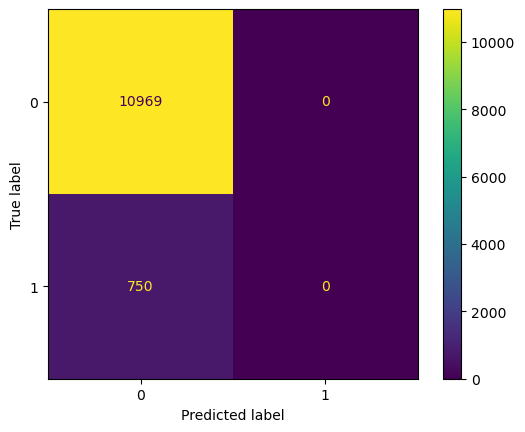

In [72]:
from sklearn.metrics import plot_confusion_matrix, classification_report 
plot_confusion_matrix(lr,X_test_scaled,y_test)

In [73]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train, y_train_predict))
print(accuracy_score(y_test, y_test_predict))

0.9360399377040087
0.9360013653042069


In [74]:
from sklearn.metrics import classification_report, recall_score, precision_score, f1_score
classf_report = classification_report(y_test,y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.94      1.00      0.97     10969
           1       0.00      0.00      0.00       750

    accuracy                           0.94     11719
   macro avg       0.47      0.50      0.48     11719
weighted avg       0.88      0.94      0.91     11719



In [75]:
accuracy_train = accuracy_score(y_train,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df_ = pd.DataFrame({'Model Name' : 'Logistic_regression',
                   'Train Accuracy': [accuracy_train],
                   'Test Accuracy': [accuracy_test],
                   'Train Precision': [precision_train],
                   'Test Precision': [precision_test],
                   'Train Recall': [recall_train],
                   'Test Recall': [recall_test],
                   'Train F1 Score': [f1_train],
                   'Test F1 Score': [f1_test]})

#### Model 2  : Decision Tree 

In [76]:
from sklearn.model_selection import RandomizedSearchCV

# Hypertuning
from sklearn.tree import DecisionTreeClassifier
Dt = DecisionTreeClassifier()

# from sklearn.model_selection import GridSearchCV
# param_dict = {'criterion': ['gini', 'entropy'],
#               'max_depth' : [8,12,16],
#               'max_features' : ['auto', 'sqrt', 'log2', None],
#               'random_state' : [0,1,34,43,42],
#               'ccp_alpha' : [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1.0],
#               'class_weight' : [None, 'balanced', {1:100, 0:0.1}]}

# Hyptuned_model = RandomizedSearchCV(Dt,cv = 10, param_distributions = param_dict, verbose = 15, n_jobs = -1, scoring = 'accuracy')
# Hyptuned_model.fit(X_train_scaled, y_train)

In [77]:
# Hyptuned_model.best_params_

In [78]:
Dt.set_params(criterion ='gini',
max_depth = 12,
max_features = 'log2',
random_state = 1,
class_weight = 'balanced',
ccp_alpha = 0.001)

DecisionTreeClassifier(ccp_alpha=0.001, class_weight='balanced', max_depth=12,
                       max_features='log2', random_state=1)

In [79]:
# Fitting the model
Dt.fit(X_train_scaled,y_train)

# Predection
Y_train_predict = Dt.predict(X_train_scaled)
y_test_predict = Dt.predict(X_test_scaled)

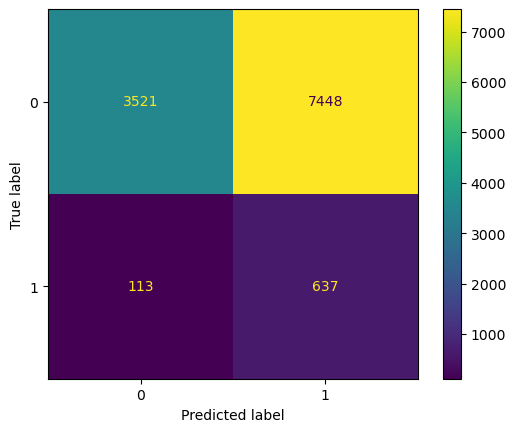

In [80]:
# Confusion matrix
from sklearn.metrics import plot_confusion_matrix
confusion_mat = plot_confusion_matrix(Dt, X_test_scaled, y_test)
confusion_mat

In [81]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train, y_train_predict))
print(accuracy_score(y_test, y_test_predict))

0.9360399377040087
0.35480843075347723


In [82]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test, y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.97      0.32      0.48     10969
           1       0.08      0.85      0.14       750

    accuracy                           0.35     11719
   macro avg       0.52      0.59      0.31     11719
weighted avg       0.91      0.35      0.46     11719



In [83]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df_.loc[len(df_)] = ['Decision Tree Classifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test]

#### Model 3 : Random Forest

In [84]:
from sklearn.ensemble import RandomForestClassifier
Rf = RandomForestClassifier() 

# from sklearn.model_selection import GridSearchCV
# param_dict = {'criterion': ['gini', 'entropy'],
#               'max_depth' : [12,15,18],
#               'max_features' : ['auto', 'sqrt', 'log2', None],
#               'bootstrap' : [True, False],
#               'random_state' : [0,1,43,65]}

# Hyptuned_model = RandomizedSearchCV(Rf,cv = 5, param_distributions = param_dict, verbose = 15, n_jobs = -1)
# Hyptuned_model.fit(X_train_scaled, y_train)

In [85]:
# Hyptuned_model.best_params_

In [86]:
Rf.set_params(bootstrap = True,
 criterion ='entropy',
 max_depth = 12,
 max_features = None,
 random_state = 0,
 class_weight = 'balanced')

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=12, max_features=None, random_state=0)

In [87]:
Rf.fit(X_train_scaled,y_train)

# Predicting the output
y_train_predict = Rf.predict(X_train_scaled)
y_test_predict = Rf.predict(X_test_scaled)

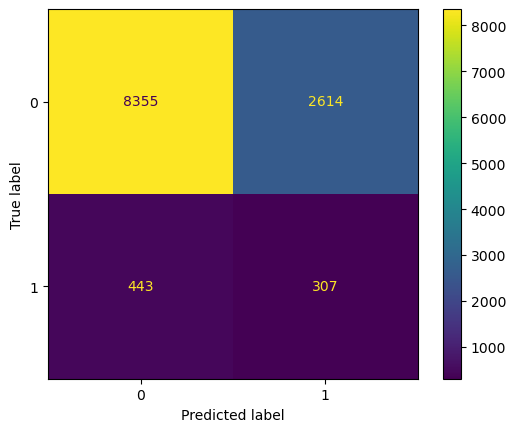

In [88]:
# confusion matrix
from sklearn.metrics import plot_confusion_matrix, classification_report 
plot_confusion_matrix(Rf, X_test_scaled, y_test)

In [89]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train, y_train_predict))
print(accuracy_score(y_test, y_test_predict))

0.7853561751968084
0.7391415649799471


In [90]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test, y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.95      0.76      0.85     10969
           1       0.11      0.41      0.17       750

    accuracy                           0.74     11719
   macro avg       0.53      0.59      0.51     11719
weighted avg       0.90      0.74      0.80     11719



In [91]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df_.loc[len(df_)] = ['Random Forest Classifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test]

#### Model 4 :  XGBoost

In [92]:
import xgboost as xgb
model_xgb=xgb.XGBClassifier(random_state=1,learning_rate=0.1,max_depth=15, gamma = 0.01)
model_xgb.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.01, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1, ...)

In [93]:
# Predicting the output
y_train_predict = model_xgb.predict(X_train_scaled)
y_test_predict = model_xgb.predict(X_test_scaled)

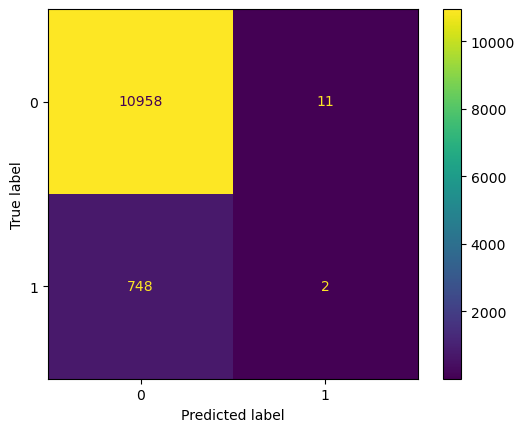

In [94]:
from sklearn.metrics import plot_confusion_matrix, classification_report 
plot_confusion_matrix(model_xgb, X_test_scaled, y_test)

In [95]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train, y_train_predict))
print(accuracy_score(y_test, y_test_predict))

0.9488191496170503
0.9352333816878573


In [96]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test, y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.94      1.00      0.97     10969
           1       0.15      0.00      0.01       750

    accuracy                           0.94     11719
   macro avg       0.54      0.50      0.49     11719
weighted avg       0.89      0.94      0.91     11719



In [97]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df_.loc[len(df_)] = ['XGB Classifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test]

#### Model 5 : LightGBM

In [98]:
import lightgbm as lgb
model = lgb.LGBMClassifier(learning_rate = 0.1, class_weight = 'balanced', n_estimators = 100,boosting_type = 'dart')
model.fit(X_train_scaled, y_train)

LGBMClassifier(boosting_type='dart', class_weight='balanced')

In [99]:
# Predicting the output
y_train_predict = model.predict(X_train_scaled)
y_test_predict = model.predict(X_test_scaled)

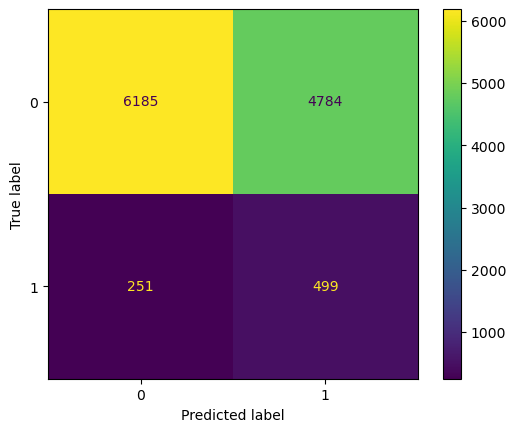

In [100]:
from sklearn.metrics import plot_confusion_matrix, classification_report 
plot_confusion_matrix(model, X_test_scaled, y_test)

In [101]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train, y_train_predict))
print(accuracy_score(y_test, y_test_predict))

0.5941586841038551
0.5703558324089086


In [102]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test, y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.96      0.56      0.71     10969
           1       0.09      0.67      0.17       750

    accuracy                           0.57     11719
   macro avg       0.53      0.61      0.44     11719
weighted avg       0.91      0.57      0.68     11719



In [103]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df_.loc[len(df_)] = ['LGBM Classifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test]

#### Outputs of all the models

In [104]:
df_.sort_values(by = 'Test Recall', inplace = True, ascending = False, ignore_index = True)
df_

,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1 Score,Test F1 Score
0,Decision Tree Classifier,0.936040,0.354808,0.000000,0.078788,0.000000,0.849333,0.000000,0.144199
1,LGBM Classifier,0.594159,0.570356,0.113539,0.094454,0.785190,0.665333,0.198390,0.165424
2,Random Forest Classifier,0.785356,0.739142,0.202159,0.105101,0.799533,0.409333,0.322720,0.167257
3,XGB Classifier,0.948819,0.935233,1.000000,0.153846,0.199800,0.002667,0.333055,0.005242
4,Logistic_regression,0.936040,0.936001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


###### Conclusion : LGBM Classifier is comparatively giving better results with 0.66 recall and 0.59 accuracy

#### Model building - By selecting features

In [105]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif
best_features = SelectKBest(k=28)
X_train_selected = best_features.fit_transform(X_train_scaled, y_train)
selected_feature_indices = best_features.get_support(indices=True)
selected_feature_indices

array([ 0,  1,  2,  3,  4,  6,  7,  9, 12, 13, 15, 18, 21, 23, 28, 31, 32,
       34, 37, 41, 42, 46, 47, 48, 50, 51, 52, 53], dtype=int64)

In [106]:
best_features.get_feature_names_out()

array(['policy_tenure', 'age_of_car', 'age_of_policyholder',
       'population_density', 'displacement', 'length', 'width',
       'gross_weight', 'torque_rpm', 'power', 'area_cluster_encoded',
       'make_2', 'make_5', 'segment_B2', 'fuel_type_Petrol', 'is_esc_Yes',
       'is_adjustable_steering_Yes', 'is_parking_sensors_Yes',
       'cylinder_4', 'steering_type_Power', 'is_front_fog_lights_Yes',
       'is_brake_assist_Yes', 'is_power_door_locks_Yes',
       'is_central_locking_Yes', 'is_driver_seat_height_adjustable_Yes',
       'is_day_night_rear_view_mirror_Yes', 'is_ecw_Yes',
       'is_speed_alert_Yes'], dtype=object)

In [107]:
X_train_selected.shape

(46873, 28)

In [108]:
X_test_sampled = best_features.transform(X_test_scaled)

In [109]:
X_train_selected = pd.DataFrame(X_train_selected, columns = best_features.get_feature_names_out())
X_test_sampled = pd.DataFrame(X_test_sampled, columns = best_features.get_feature_names_out())

#### Handling imbalance dataset

In [110]:
from imblearn.over_sampling import RandomOverSampler 
ROS = RandomOverSampler(sampling_strategy = 'minority',random_state = 42)
X_train_sampled, y_train_sampled = ROS.fit_resample(X_train_selected, y_train)

In [111]:
X_train_sampled.shape

(87750, 28)

In [112]:
len(y_train_sampled[y_train_sampled ==1]), len(y_train_sampled[y_train_sampled ==0])

(43875, 43875)

#### Model 1  : Logistic Regression

In [113]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()

# param_grid ={'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
#     'C' : np.logspace(-4, 4, 20),
#     'solver' : ['lbfgs','newton-cg','liblinear'],
#     'max_iter' : [500, 1000, 1500],
#     'class_weight' : [None, 'balanced', {1:100, 0:0.1}]     
#     }
# Hyptuned_model = RandomizedSearchCV(lr, param_distributions = param_grid, cv = 5, verbose=True, n_jobs=-1)
# Hyptuned_model.fit(X_train_sampled,y_train_sampled)

In [114]:
# Hyptuned_model.best_params_

In [115]:
lr.set_params(solver = 'lbfgs',
penalty = 'l2',
max_iter = 1000,
C = 11.288378916846883,
class_weight = 'balanced') 

LogisticRegression(C=11.288378916846883, class_weight='balanced', max_iter=1000)

In [116]:
lr.fit(X_train_sampled, y_train_sampled) 

LogisticRegression(C=11.288378916846883, class_weight='balanced', max_iter=1000)

In [117]:
# predecting the output
y_train_predict = lr.predict(X_train_sampled)
y_test_predict = lr.predict(X_test_sampled)

In [118]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled, y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.5764558404558404
0.5548254970560628


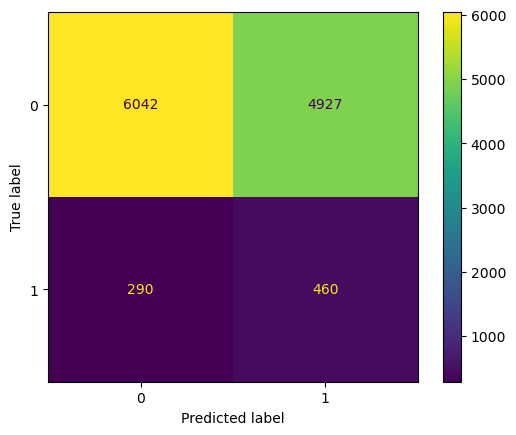

In [119]:
from sklearn.metrics import plot_confusion_matrix, classification_report 
plot_confusion_matrix(lr,X_test_sampled,y_test)

In [120]:
from sklearn.metrics import classification_report, recall_score, precision_score, f1_score
classf_report = classification_report(y_test, y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.95      0.55      0.70     10969
           1       0.09      0.61      0.15       750

    accuracy                           0.55     11719
   macro avg       0.52      0.58      0.42     11719
weighted avg       0.90      0.55      0.66     11719



In [121]:
# ROC and AUC

In [122]:
y_pred_proba = lr.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

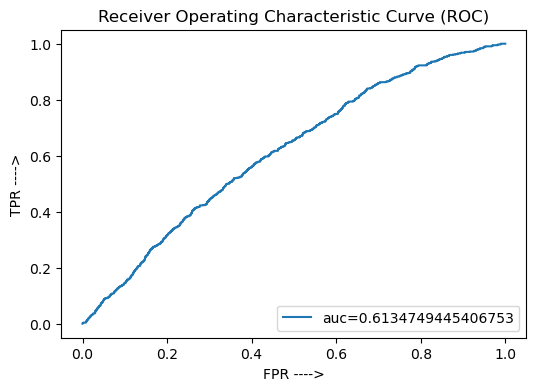

In [123]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [124]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df = pd.DataFrame({'Model Name' : 'Logistic_regression',
                   'Train Accuracy': [accuracy_train],
                   'Test Accuracy': [accuracy_test],
                   'Train Precision': [precision_train],
                   'Test Precision': [precision_test],
                   'Train Recall': [recall_train],
                   'Test Recall': [recall_test],
                   'Train F1 Score': [f1_train],
                   'Test F1 Score': [f1_test],
                   'Roc_Auc' : [auc]})

#### Model 2  : Decision Tree 

In [125]:
# Hypertuning
from sklearn.tree import DecisionTreeClassifier
Dt = DecisionTreeClassifier()

# from sklearn.model_selection import GridSearchCV
# param_dict = {'criterion': ['gini', 'entropy'],
#               'max_depth' : [16,18,25],
#               'max_features' : ['auto', 'sqrt', 'log2', None],
#               'random_state' : [42,0,60]
#              }

# Hyptuned_model = GridSearchCV(Dt,cv = 10, param_grid = param_dict, verbose = 15, n_jobs = -1)
# Hyptuned_model.fit(X_train_sampled, y_train_sampled)

In [126]:
# Hyptuned_model.best_params_

In [127]:
Dt.set_params(criterion ='gini',
max_depth = 25,
max_features = 'auto',
random_state = 0,
class_weight = {1:100,0:0.001}) 

DecisionTreeClassifier(class_weight={0: 0.001, 1: 100}, max_depth=25,
                       max_features='auto', random_state=0)

In [128]:
# Fitting the model
Dt.fit(X_train_sampled, y_train_sampled)

# Predection
Y_train_predict = Dt.predict(X_train_sampled)
y_test_predict = Dt.predict(X_test_sampled)

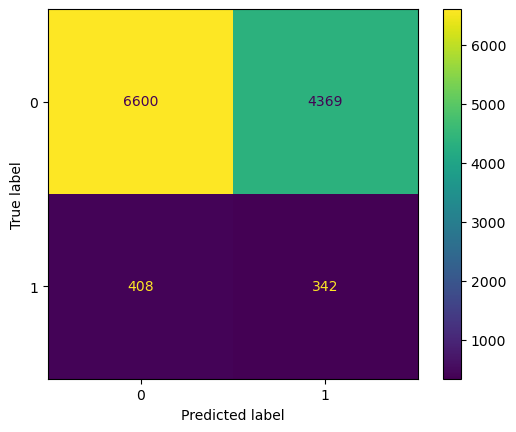

In [129]:
# Confusion matrix
from sklearn.metrics import plot_confusion_matrix
confusion_mat = plot_confusion_matrix(Dt, X_test_sampled, y_test)
confusion_mat

In [130]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled,y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.5764558404558404
0.5923713627442615


In [131]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test,y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.94      0.60      0.73     10969
           1       0.07      0.46      0.13       750

    accuracy                           0.59     11719
   macro avg       0.51      0.53      0.43     11719
weighted avg       0.89      0.59      0.70     11719



In [132]:
# ROC and AUC

In [133]:
y_pred_proba = Dt.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

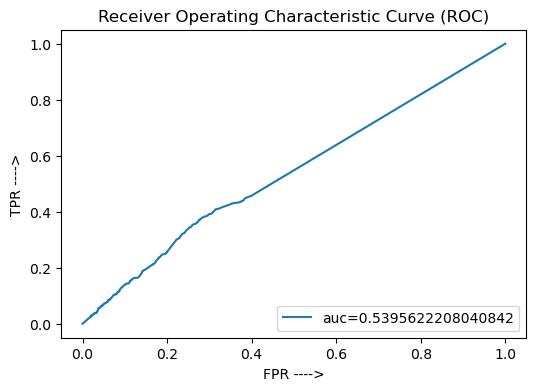

In [134]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [135]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df.loc[len(df)] = ['Decision_Tree_Classifier',accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test, auc]

#### Model 3 : Random Forest

In [136]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
Rf = RandomForestClassifier() 

# from sklearn.model_selection import GridSearchCV
# param_dict = {'criterion': ['gini', 'entropy'],
#               'max_depth' : [16,18,25],
#               'max_features' : ['auto', 'sqrt', 'log2', None],
#               'bootstrap' : [True, False],
#               'random_state' : [0,1,43,65],
#              'n_estimators': [100, 200, 300, 1000]}

# Hyptuned_model = RandomizedSearchCV(Rf,cv = 5, param_distributions = param_dict, verbose = 15, n_jobs = -1)
# Hyptuned_model.fit(X_train_sampled, y_train_sampled)

In [137]:
# Hyptuned_model.best_params_

In [138]:
Rf.set_params(random_state = 0,
 n_estimators = 200,
 max_features = 'auto',
 max_depth = 25,
 criterion = 'gini',
 bootstrap = False,
class_weight = {1:80, 0:0.1})

RandomForestClassifier(bootstrap=False, class_weight={0: 0.1, 1: 80},
                       max_depth=25, n_estimators=200, random_state=0)

In [139]:
Rf.fit(X_train_sampled, y_train_sampled)

# Predicting the output
y_train_predict = Rf.predict(X_train_sampled)
y_test_predict = Rf.predict(X_test_sampled)

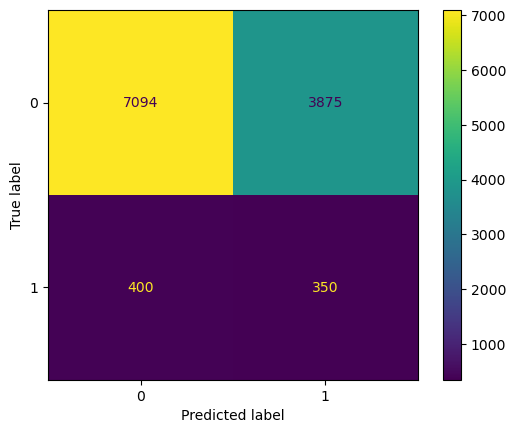

In [140]:
# Confusion matrix
from sklearn.metrics import plot_confusion_matrix
confusion_mat = plot_confusion_matrix(Rf, X_test_sampled, y_test)
confusion_mat

In [141]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled,y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.8385868945868946
0.635207782233979


In [142]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test,y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.95      0.65      0.77     10969
           1       0.08      0.47      0.14       750

    accuracy                           0.64     11719
   macro avg       0.51      0.56      0.45     11719
weighted avg       0.89      0.64      0.73     11719



In [143]:
# ROC and AUC

In [144]:
y_pred_proba = Rf.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

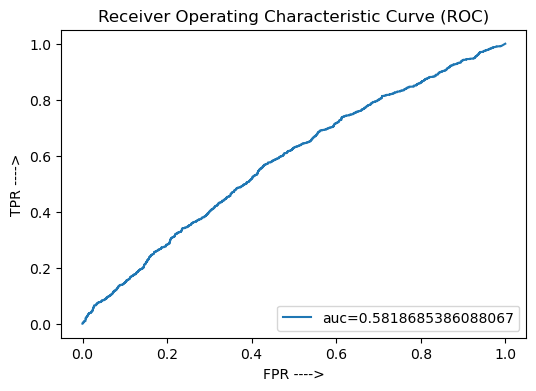

In [145]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [146]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df.loc[len(df)] = ['Random Forest Classifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test, auc]

#### Model 4 : AdaBoost Classifier using DT

In [147]:
from sklearn.ensemble import AdaBoostClassifier

In [148]:
adaboost_clf = AdaBoostClassifier()

# param_dict = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.1, 0.5, 1.0],
#       'algorithm' : ['SAMME', 'SAMME.R'],
#       'random_state' : [0, 25, 42]}

# Hyptuned_model = RandomizedSearchCV(adaboost_clf,cv = 5, param_distributions = param_dict, verbose = True, n_jobs = -1)
# Hyptuned_model.fit(X_train_sampled, y_train_sampled)

In [149]:
# Hyptuned_model.best_params_

In [150]:
# adaboost_clf.get_params().keys()

In [151]:
adaboost_clf.set_params(random_state = 0,
 n_estimators = 200,
 learning_rate = 0.1,
algorithm = 'SAMME.R')

AdaBoostClassifier(learning_rate=0.1, n_estimators=200, random_state=0)

In [152]:
adaboost_clf.fit(X_train_sampled, y_train_sampled)

AdaBoostClassifier(learning_rate=0.1, n_estimators=200, random_state=0)

In [153]:
# Predicting the output
y_train_predict = adaboost_clf.predict(X_train_sampled)
y_test_predict = adaboost_clf.predict(X_test_sampled)

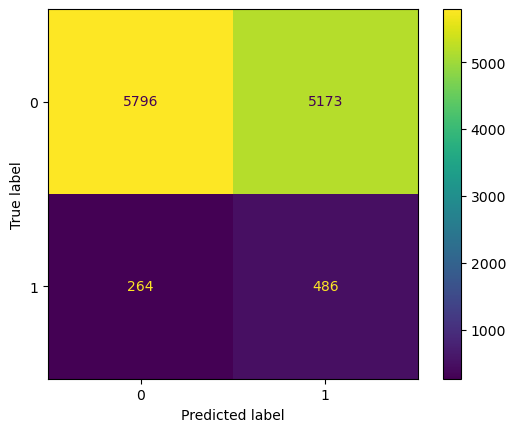

In [154]:
# Confusion matrix
from sklearn.metrics import plot_confusion_matrix
confusion_mat = plot_confusion_matrix(adaboost_clf, X_test_sampled, y_test)
confusion_mat

In [155]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled,y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.6099031339031339
0.5360525642119635


In [156]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test,y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.96      0.53      0.68     10969
           1       0.09      0.65      0.15       750

    accuracy                           0.54     11719
   macro avg       0.52      0.59      0.42     11719
weighted avg       0.90      0.54      0.65     11719



In [157]:
# ROC and AUC

In [158]:
y_pred_proba = adaboost_clf.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

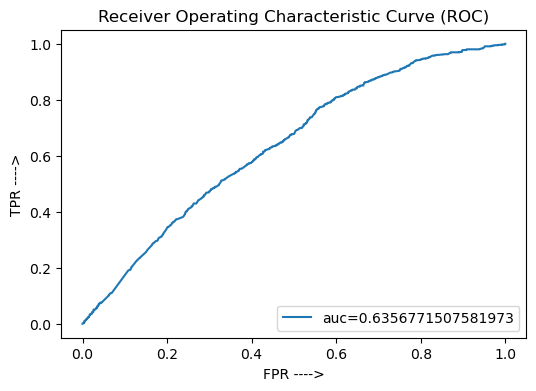

In [159]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [160]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df.loc[len(df)] = ['AdaBoost_Classifier_Dt', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test, auc]

#### Model 5 :  XGBoost

In [161]:
import xgboost as xgb
model_xgb=xgb.XGBClassifier()

# y_mean = np.mean(y_train_sampled) 

# positive_samples = (y_train_sampled == 1).sum()
# negative_samples = (y_train_sampled == 0).sum()
# scale_pos_weight = negative_samples / positive_samples

# param_dict = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.1, 0.5, 1.0],
#     'max_depth': [3, 4, 5],
#     'min_child_weight': [1, 3, 5],
#     'subsample': [0.5, 0.75, 1.0],
#     'gamma': [0, 0.1, 0.2, None],
# 'booster' : ['gbtree', 'gblinear', None],
# 'base_score' : [y_mean, None],
# 'scale_pos_weight' : [None, scale_pos_weight]}

# Hyptuned_model = RandomizedSearchCV(model_xgb,cv = 10, param_distributions = param_dict, verbose = 15, n_jobs = -1)
# Hyptuned_model.fit(X_train_sampled, y_train_sampled)

In [162]:
# Hyptuned_model.best_params_

In [163]:
model_xgb.set_params(n_estimators = 50,
learning_rate = 0.5,
max_depth = 4,
min_child_weight = 3,
subsample = 1.0,
gamma = 0.2,
scale_pos_weight = None,
booster = None,
base_score = 0.5)

XGBClassifier(base_score=0.5, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [164]:
# model_xgb=xgb.XGBClassifier(random_state=1,learning_rate=0.01,max_depth=20)
model_xgb.fit(X_train_sampled, y_train_sampled)

XGBClassifier(base_score=0.5, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [165]:
# Predicting the output
y_train_predict = model_xgb.predict(X_train_sampled)
y_test_predict = model_xgb.predict(X_test_sampled)

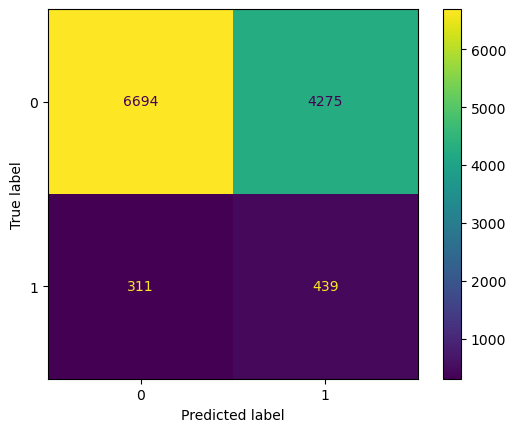

In [166]:
# Confusion matrix
from sklearn.metrics import plot_confusion_matrix
confusion_mat = plot_confusion_matrix(model_xgb, X_test_sampled, y_test)
confusion_mat

In [167]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled,y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.7074529914529915
0.6086696817134568


In [168]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test,y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.96      0.61      0.74     10969
           1       0.09      0.59      0.16       750

    accuracy                           0.61     11719
   macro avg       0.52      0.60      0.45     11719
weighted avg       0.90      0.61      0.71     11719



In [169]:
# ROC and AUC

In [170]:
y_pred_proba = model_xgb.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

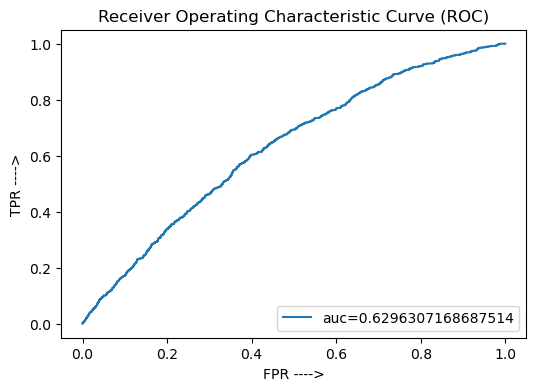

In [171]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [172]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df.loc[len(df)] = ['XGBClassifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test, auc]

#### Model 6 : LightGBM

In [173]:
import lightgbm as lgb
model = lgb.LGBMClassifier()

# param_dict = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.1, 0.5, 1.0],
#     'max_depth': [5, 10, 25],
#     'min_child_samples': [10, 20, 30, None],
#     'boosting_type' : ['gbdt', 'dart', 'goss', None],
#     'class_weight' : [None, 'balanced', {1:100, 0:0.1}]
# }

# Hyptuned_model = RandomizedSearchCV(model,cv = 10, param_distributions = param_dict, verbose = 15, n_jobs = -1)
# Hyptuned_model.fit(X_train_sampled, y_train_sampled)

In [174]:
# Hyptuned_model.best_params_

In [175]:
model.set_params(
 n_estimators = 100,
 min_child_samples = 30,
 max_depth = 4,
 learning_rate = 0.1,
 class_weight = 'balanced',
 boosting_type = 'gbdt'
)

LGBMClassifier(class_weight='balanced', max_depth=4, min_child_samples=30)

In [176]:
model.fit(X_train_sampled, y_train_sampled)

LGBMClassifier(class_weight='balanced', max_depth=4, min_child_samples=30)

In [177]:
# Predicting the output
y_train_predict = model.predict(X_train_sampled)
y_test_predict = model.predict(X_test_sampled)

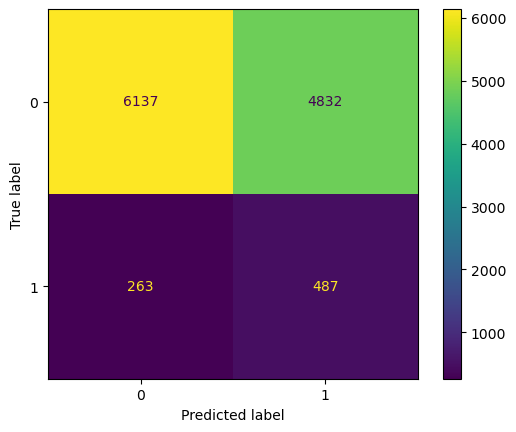

In [178]:
from sklearn.metrics import plot_confusion_matrix, classification_report 
plot_confusion_matrix(model,X_test_sampled, y_test)

In [179]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled,y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.6594529914529914
0.5652359416332452


In [180]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test, y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.96      0.56      0.71     10969
           1       0.09      0.65      0.16       750

    accuracy                           0.57     11719
   macro avg       0.53      0.60      0.43     11719
weighted avg       0.90      0.57      0.67     11719



In [181]:
# ROC and AUC

In [182]:
y_pred_proba = model.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

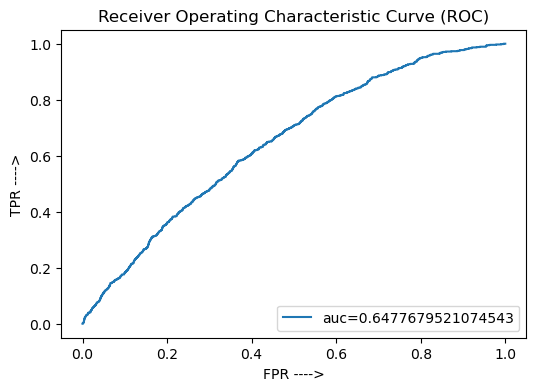

In [183]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [184]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df.loc[len(df)] = ['LGBMClassifier', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test, auc]

#### Model 7 :  Naive Bayes 

In [185]:
from sklearn.naive_bayes import GaussianNB      
Gb = GaussianNB()
Gb.fit(X_train_sampled, y_train_sampled) 
y_train_predict = Gb.predict(X_train_sampled)  
y_test_predict = Gb.predict(X_test_sampled)

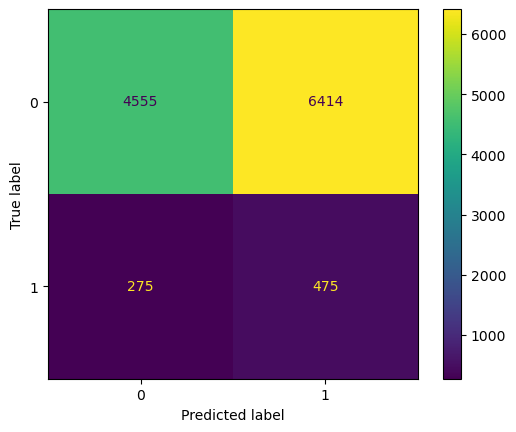

In [186]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(Gb, X_test_sampled, y_test)

In [187]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_train_sampled,y_train_predict))
print(accuracy_score(y_test,y_test_predict))

0.5288888888888889
0.42921751002645275


In [188]:
from sklearn.metrics import classification_report
classf_report = classification_report(y_test,y_test_predict)
print(classf_report)

              precision    recall  f1-score   support

           0       0.94      0.42      0.58     10969
           1       0.07      0.63      0.12       750

    accuracy                           0.43     11719
   macro avg       0.51      0.52      0.35     11719
weighted avg       0.89      0.43      0.55     11719



In [189]:
# ROC and AUC

In [190]:
y_pred_proba = Gb.predict_proba(X_test_sampled)
y_pred_proba = y_pred_proba[::,1]

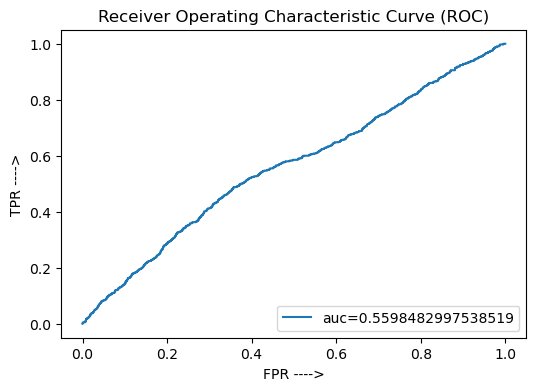

In [191]:
# metrics.roc_curve returns three outputs: fpr, tpr and different thresholds
from sklearn import metrics
fpr, tpr, threshold = metrics.roc_curve(y_test,  y_pred_proba)   

#metrics.roc_auc_score directly returns the auc for y_actual and corresponding prob values of success for each row
auc = metrics.roc_auc_score(y_test, y_pred_proba)

# Plotting the AUC curve
plt.figure(figsize=(6,4))
# plt.plot(fpr,tpr,label="ROC")
plt.plot(fpr,tpr,label="auc="+str(auc))
plt.legend(loc=4)
plt.title("Receiver Operating Characteristic Curve (ROC)")
plt.xlabel("FPR ---->")
plt.ylabel("TPR ---->")
plt.show()

In [192]:
from sklearn.metrics import recall_score, precision_score, f1_score

accuracy_train = accuracy_score(y_train_sampled,y_train_predict)
accuracy_test = accuracy_score(y_test,y_test_predict)
precision_train = precision_score(y_train_sampled,y_train_predict)
precision_test = precision_score(y_test,y_test_predict)
recall_train = recall_score(y_train_sampled,y_train_predict)
recall_test = recall_score(y_test,y_test_predict)
f1_train = f1_score(y_train_sampled,y_train_predict)
f1_test = f1_score(y_test,y_test_predict)

df.loc[len(df)] = ['GaussianNB', accuracy_train, accuracy_test, precision_train, precision_test, recall_train, recall_test, f1_train, f1_test, auc]

#### Output of all the models

In [193]:
data = df.sort_values(by = 'Test Recall', inplace = True, ascending = False, ignore_index = True)

In [194]:
df # sorted based on recall value

,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1 Score,Test F1 Score,Roc_Auc
0,LGBMClassifier,0.659453,0.565236,0.636523,0.091559,0.743430,0.649333,0.685836,0.160488,0.647768
1,AdaBoost_Classifier_Dt,0.609903,0.536053,0.595504,0.085881,0.685288,0.648000,0.637249,0.151662,0.635677
2,GaussianNB,0.528889,0.429218,0.523398,0.068951,0.646222,0.633333,0.578361,0.124362,0.559848
3,Logistic_regression,0.576456,0.554825,0.573270,0.085391,0.598199,0.613333,0.585469,0.149910,0.613475
4,XGBClassifier,0.707453,0.608670,0.681271,0.093127,0.779670,0.585333,0.727157,0.160688,0.629631
5,Random Forest Classifier,0.838587,0.635208,0.755957,0.082840,1.000000,0.466667,0.861020,0.140704,0.581869
6,Decision_Tree_Classifier,0.576456,0.592371,0.573270,0.072596,0.598199,0.456000,0.585469,0.125252,0.539562


##### Conclusion :

AdaBoost_Classifier_Dt, LGBMClassifier

Above listed Models are giving average perfomance as compare to rest of the models

#### Predection of future_pred_ dataset

In [195]:
future_pred_features = best_features.transform(future_pred_)

#### LGBM_Classifier

In [199]:
# Predicting the output
future_predict_lgbm = model.predict(future_pred_features)

In [200]:
len(future_predict_lgbm[future_predict_lgbm == 1])

17549

In [201]:
len(future_predict_lgbm[future_predict_lgbm == 0])

21514

#### Adaboost_Classifier

In [196]:
# Predicting the output
future_predict_ada = adaboost_clf.predict(future_pred_features)

In [197]:
len(future_predict_ada[future_predict_ada == 1])

18825

In [198]:
len(future_predict_ada[future_predict_ada == 0])

20238

#### Conclusion

In [208]:
data = {'Factors' : ['policy_tenure', 'age_of_car', 'age_of_policyholder',
       'population_density', 'displacement', 'length', 'width',
       'gross_weight', 'torque_rpm', 'power', 'area_cluster_encoded',
       'make_2', 'make_5', 'segment_B2', 'fuel_type_Petrol', 'is_esc_Yes',
       'is_adjustable_steering_Yes', 'is_parking_sensors_Yes',
       'cylinder_4', 'steering_type_Power', 'is_front_fog_lights_Yes',
       'is_brake_assist_Yes', 'is_power_door_locks_Yes',
       'is_central_locking_Yes', 'is_driver_seat_height_adjustable_Yes',
       'is_day_night_rear_view_mirror_Yes', 'is_ecw_Yes',
       'is_speed_alert_Yes']}

#### Factors influencing claim frequency are as follows:

In [209]:
pd.DataFrame(data)

,Factors
0,policy_tenure
1,age_of_car
2,age_of_policyholder
3,population_density
4,displacement
5,length
6,width
7,gross_weight
8,torque_rpm
9,power
